# MAGIC Gamma Cherenkov Telescope Dataset: Classical Machine Learning Benchmark

This notebook presents a complete **machine-learning analysis** for the **[MAGIC Gamma Cherenkov Telescope dataset](https://www.kaggle.com/datasets/abhinavmangalore/magic-gamma-cherenkov-telescope-dataset/data)**.
The goal is to **classify atmospheric Cherenkov events** into two categories:

- **Signal (`g`)** → gamma-ray-induced showers  
- **Background (`h`)** → hadron-induced showers  

We will compare several **classical ML algorithms** and evaluate them under astrophysically relevant metrics — emphasizing **low false-positive rates (FPR)**, as recommended by the original dataset authors.

---

### **Scientific Context**

MAGIC (Major Atmospheric Gamma-Imaging Cherenkov) telescopes detect gamma rays indirectly through short optical flashes (“Cherenkov light”) produced when high-energy particles strike the upper atmosphere. Each detected event forms a compact **shower image** in the camera, summarized by **Hillas parameters** such as image length, width, asymmetry, and orientation etc. These features statistically distinguish **gamma events** from **hadronic background**.

---

## Dataset Description

- **Source:**[UCI Machine Learning Repository](https://archive.ics.uci.edu/dataset/159/magic+gamma+telescope)  
- **File:** `magic04.csv`  
- **Instances:** 19,020 simulated events  
- **Features (10):**
  1. `fLength` – major axis of the ellipse (image length)  
  2. `fWidth` – minor axis of the ellipse (image width)  
  3. `fSize` – total light (log of the summed intensities)  
  4. `fConc` – ratio of light contained in the two brightest pixels  
  5. `fConc1` – ratio of light in the brightest pixel  
  6. `fAsym` – asymmetry of the light distribution  
  7. `fM3Long`  – third moments along the major axis  
  8. `fM3Trans` – third moments across the major axis  
  9. `fAlpha` – angle between shower axis and camera center  
  10. `fDist` – distance from camera center to image centroid  
- **Target:** `class` → `'g'` (gamma) or `'h'` (hadron)

For physical reasons, *hadron events dominate in real data*, but this Monte-Carlo sample is slightly balanced to simplify model training.

--- 

## Project Objectives

1. **Load and Pre-process** the MAGIC dataset.  
2. **Train and compare** multiple classical machine-learning algorithms.  
3. **Use stratified K-fold cross-validation** to obtain out-of-fold probability estimates.  
4. **Evaluate models** with astrophysically relevant metrics:
   - True Positive Rate (TPR) at **low FPR thresholds** (0.01 – 0.20)
   - **Partial AUC** (area under ROC curve up to FPR ≤ 0.20)
   - **Overall AUC**
5. **Visualize ROC curves** (full and low-FPR regions) and rank models accordingly.


## Step 0 – Data Loading and Inspection (Exploratory Data Analysis (EDA))

We begin by reading `magic04.csv` and converting all features to numeric values, then perform EDA.  

We'll check:
- The class distribution (`y`)
- That no missing or non-numeric values remain
- Perform univariate and bi-variate analysis
- Check for correlation and mutual information
- Create the Input feature matrix (`X`) and check shape
- Create the the class vector (`y`) and check shape



In [1]:
# Import all the desired packages and libraries

import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import math

from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.decomposition import PCA
from sklearn.feature_selection import mutual_info_classif

from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC, SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    RandomForestClassifier,
    ExtraTreesClassifier,
    GradientBoostingClassifier,
)


In [2]:
# Load/Read the data

CSV_PATH   = "./magic04_gamma.csv"      # <- set your path
df = pd.read_csv(CSV_PATH)
print(df.head()) # Print the first 5 rows


   Unnamed: 0   fLength    fWidth   fSize   fConc  fConc1     fAsym  fM3Long  \
0           0   28.7967   16.0021  2.6449  0.3918  0.1982   27.7004  22.0110   
1           1   31.6036   11.7235  2.5185  0.5303  0.3773   26.2722  23.8238   
2           2  162.0520  136.0310  4.0612  0.0374  0.0187  116.7410 -64.8580   
3           3   23.8172    9.5728  2.3385  0.6147  0.3922   27.2107  -6.4633   
4           4   75.1362   30.9205  3.1611  0.3168  0.1832   -5.5277  28.5525   

   fM3Trans   fAlpha     fDist class  
0   -8.2027  40.0920   81.8828     g  
1   -9.9574   6.3609  205.2610     g  
2  -45.2160  76.9600  256.7880     g  
3   -7.1513  10.4490  116.7370     g  
4   21.8393   4.6480  356.4620     g  


In [3]:
print('\nThe shape of the data is: ', df.shape)



The shape of the data is:  (19020, 12)


In [4]:
# Check for data type of each feature
df.dtypes


Unnamed: 0      int64
fLength       float64
fWidth        float64
fSize         float64
fConc         float64
fConc1        float64
fAsym         float64
fM3Long       float64
fM3Trans      float64
fAlpha        float64
fDist         float64
class          object
dtype: object

In [5]:
# Summarize the statistics of the numeric features
df.describe()


,Unnamed: 0,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist
count,19020.000000,19020.000000,19020.000000,19020.000000,19020.000000,19020.000000,19020.000000,19020.000000,19020.000000,19020.000000,19020.000000
mean,9509.500000,53.250154,22.180966,2.825017,0.380327,0.214657,-4.331745,10.545545,0.249726,27.645707,193.818026
std,5490.745396,42.364855,18.346056,0.472599,0.182813,0.110511,59.206062,51.000118,20.827439,26.103621,74.731787
min,0.000000,4.283500,0.000000,1.941300,0.013100,0.000300,-457.916100,-331.780000,-205.894700,0.000000,1.282600
25%,4754.750000,24.336000,11.863800,2.477100,0.235800,0.128475,-20.586550,-12.842775,-10.849375,5.547925,142.492250
50%,9509.500000,37.147700,17.139900,2.739600,0.354150,0.196500,4.013050,15.314100,0.666200,17.679500,191.851450
75%,14264.250000,70.122175,24.739475,3.101600,0.503700,0.285225,24.063700,35.837800,10.946425,45.883550,240.563825
max,19019.000000,334.177000,256.382000,5.323300,0.893000,0.675200,575.240700,238.321000,179.851000,90.000000,495.561000


In [6]:
# Check for missing values if any
df.isnull().sum()


Unnamed: 0    0
fLength       0
fWidth        0
fSize         0
fConc         0
fConc1        0
fAsym         0
fM3Long       0
fM3Trans      0
fAlpha        0
fDist         0
class         0
dtype: int64

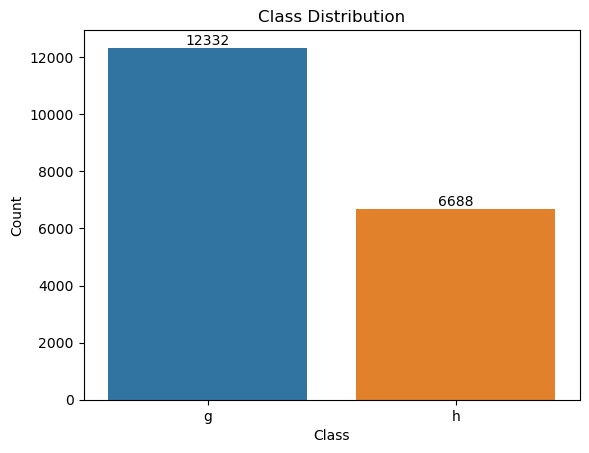

In [7]:
ax = sns.countplot(x='class', data=df)
ax.bar_label(ax.containers[0])
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.savefig("./EDA/magic_class_distribution.png", dpi=300)
plt.show()


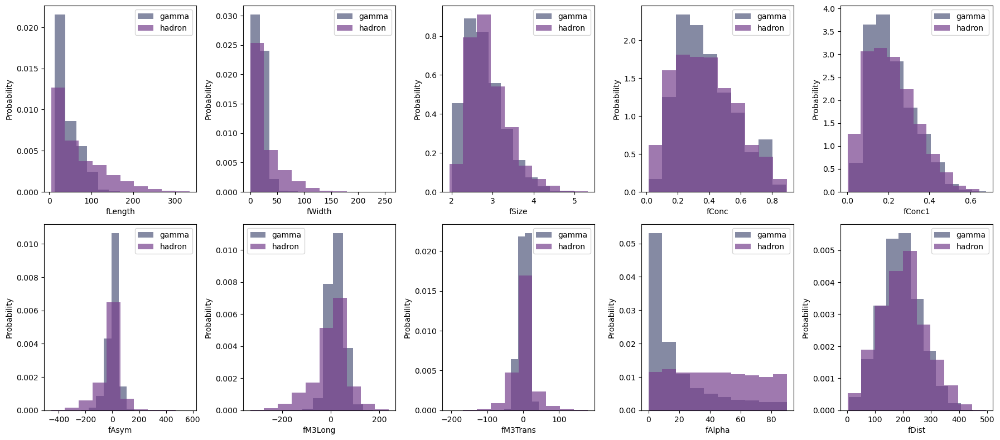

In [8]:
# Univariate analysis - Create histograms per class (per feature)

columns = ["fLength", "fWidth", "fSize", "fConc", "fConc1",
            "fAsym", "fM3Long", "fM3Trans", "fAlpha", "fDist", "class"]

# Create figure and axes (2 rows × 5 columns)
fig, axes = plt.subplots(2, 5, figsize=(18, 8))
axes = axes.flatten()

# Plot each feature
for i, label in enumerate(columns[:-1]):
    ax = axes[i]
    ax.hist(df[df["class"] == 'g'][label], color="#52597D",
            label="gamma", alpha=0.7, density=True)
    ax.hist(df[df["class"] == 'h'][label], color="#77418D",
            label="hadron", alpha=0.7, density=True)
    # ax.set_title(label)
    ax.set_xlabel(label)
    ax.set_ylabel("Probability")
    ax.legend()

# Adjust layout
plt.tight_layout()
plt.savefig("./EDA/magic_feature_histograms.png", dpi=300)
plt.show()


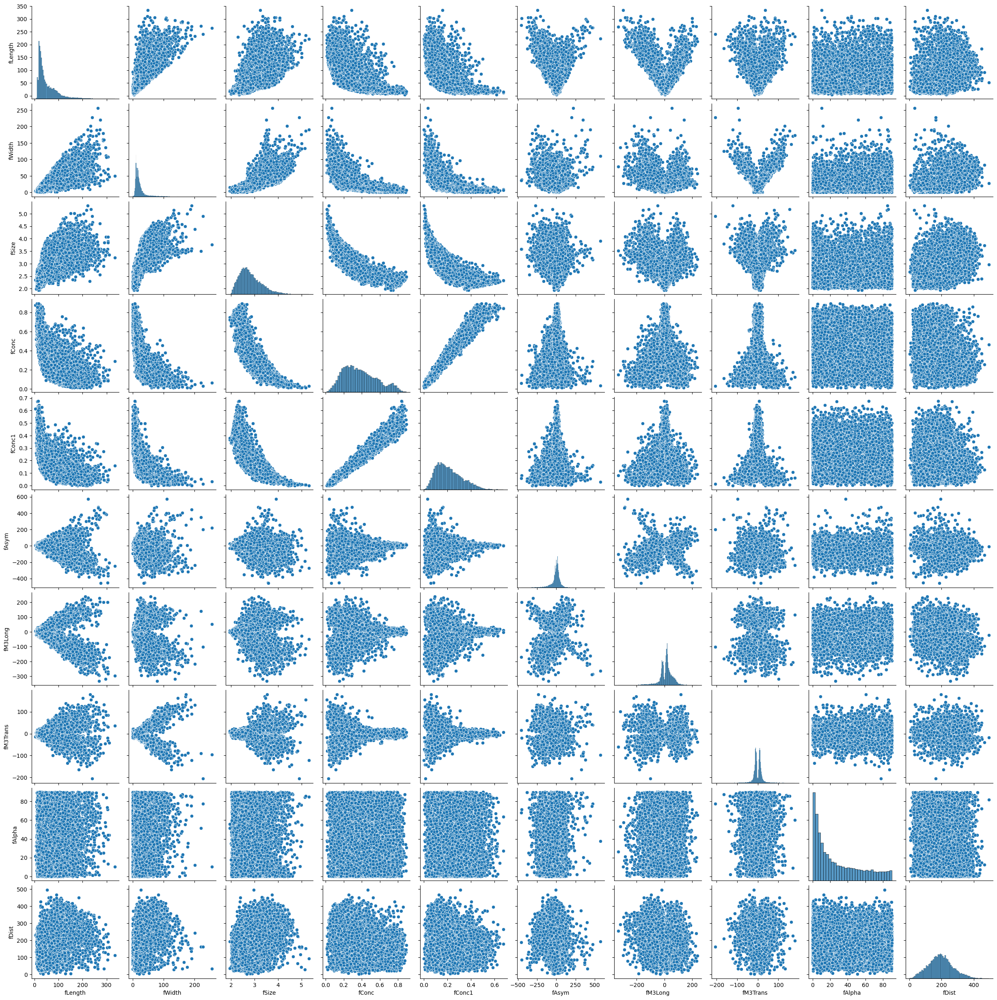

In [9]:
# Bi-variate analysis
# Create pair plots. Diagonal are histograms and off-diagonal are how one feature varies with rest
sns.pairplot(df[columns],  diag_kind='hist')
plt.savefig("./EDA/magic_pairplots.png", dpi=300)


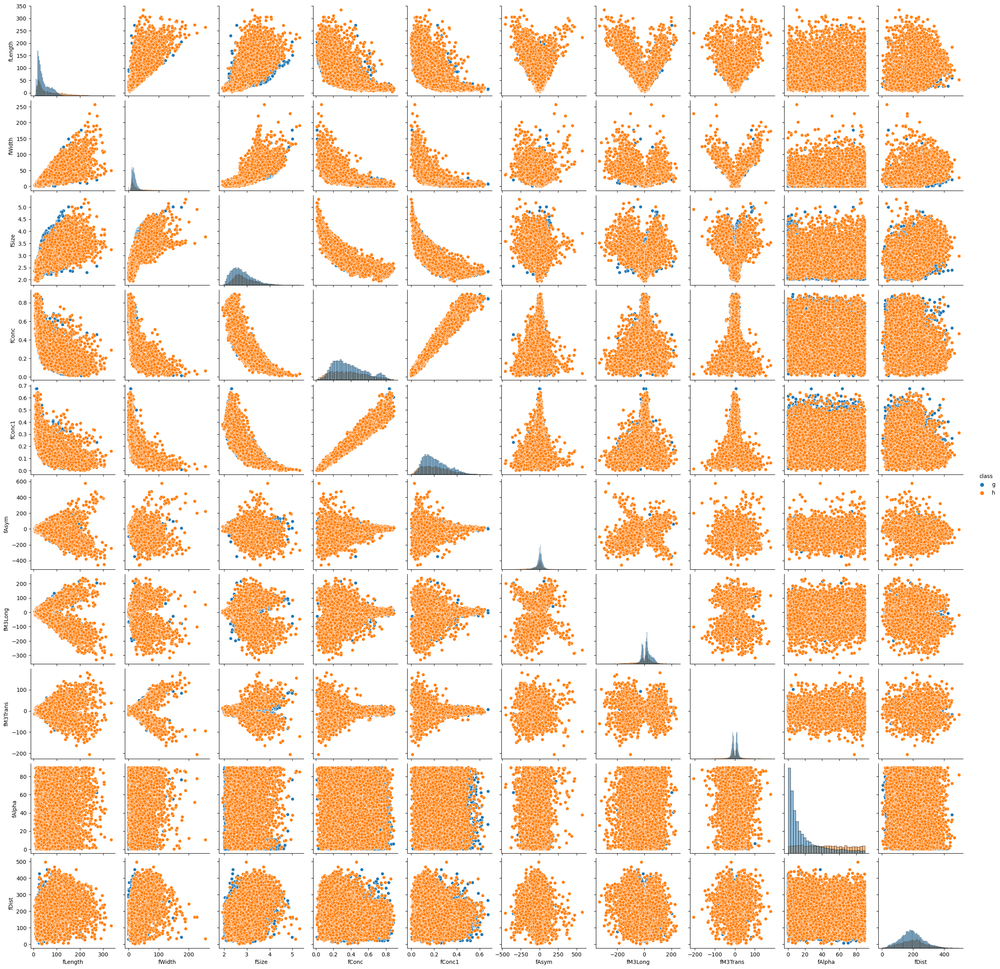

In [10]:
# Bi-variate analysis with class labels
sns.pairplot(df[columns], hue='class', diag_kind='hist')
plt.savefig("./EDA/magic_pairplots_class.png", dpi=300)
plt.show()


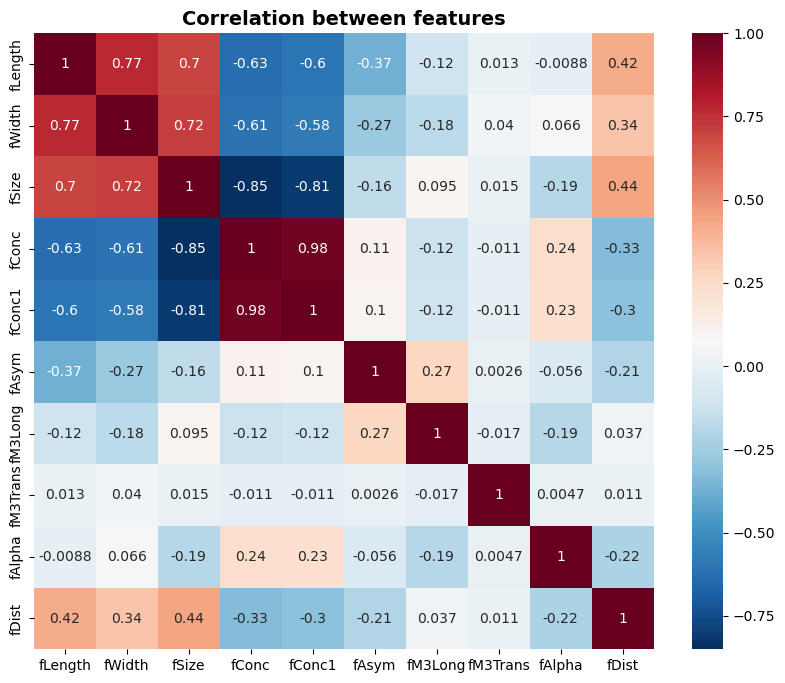

In [11]:
# Pearson correlation between features
cm = df[columns[:-1]].corr() # To avoid class labels; ‘kendall’, ‘spearman’

plt.figure(figsize=(10,8))
sns.heatmap(cm, cmap='RdBu_r', annot=True)
plt.title("Correlation between features", fontsize=14, weight='bold')
plt.savefig("./EDA/magic_correlation_features_.png")
plt.show()



    Feature  Mutual_Information
8    fAlpha            0.124170
1    fWidth            0.096833
0   fLength            0.085570
6   fM3Long            0.077693
7  fM3Trans            0.068657
2     fSize            0.052868
5     fAsym            0.043405
3     fConc            0.023764
9     fDist            0.013386
4    fConc1            0.013302




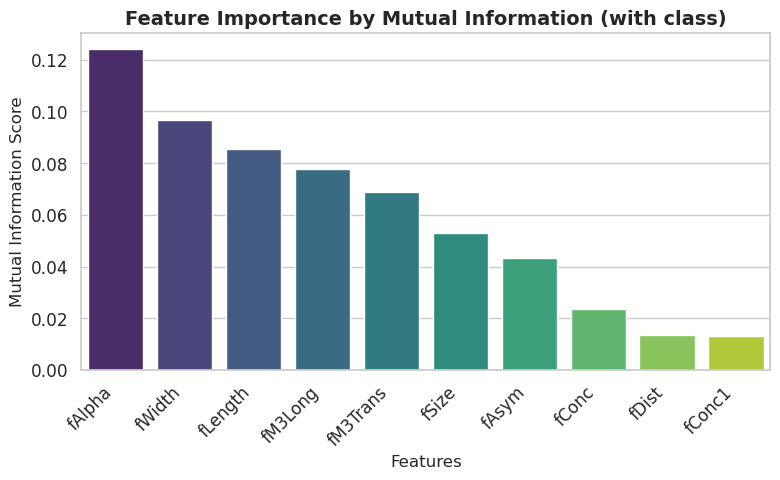

In [12]:
# Mutual Information: Measures how much knowing one feature reduces uncertainty about the target. 
# lues range from 0 (no relation) to higher positive values (strong relation).
# Nonlinear relationships are captured (unlike Pearson correlation).

# Extract feature matrix and target vector
X = df[columns[:-1]]
y = df[columns[-1]]

# Compute Mutual Information
mi_scores = mutual_info_classif(X, y, random_state=42)

# Create DataFrame
mi_df = pd.DataFrame({
    "Feature": columns[:-1],
    "Mutual_Information": mi_scores
}).sort_values(by="Mutual_Information", ascending=False)
print(mi_df)
print('\n')
# Plot
plt.figure(figsize=(8, 5))
sns.set(style="whitegrid", font_scale=1.1)

sns.barplot(
    x="Feature", 
    y="Mutual_Information", 
    data=mi_df, 
    palette="viridis"
)

plt.title("Feature Importance by Mutual Information (with class)", fontsize=14, weight='bold')
plt.xlabel("Features", fontsize=12)
plt.ylabel("Mutual Information Score", fontsize=12)
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.savefig("./EDA/magic_MIscores_features_.png")
plt.show()


### 🔍 Key Observations From:

#### 1️⃣ Dataset description

- All features are numeric and are across different scales. Standard Scaling is required.

#### 2️⃣ Cat-plot of labels

- The dataset class variables are disproportionate or imbalanced, hence bias can creep for the hadron minority class. Hence, during training minority class be oversampled to adjust the class distribution in the dataset.

#### 3️⃣ Univariate analysis

- Each histogram shows the distribution of a single feature for gamma (`g`) and hadron (`h`) classes. We generally look for **distinct peaks or non-overlapping regions** between classes, which indicate strong discriminative features. 
- Most feature distributions **overlap heavily**, suggesting **no single feature clearly separates** gamma and hadron events — implying the need for **multivariate or ML-based analysis** to capture class differences.

#### 4️⃣ Bivariate analysis
- The pair plot visualizes **pairwise relationships** between all features, colored by class (`g` vs `h`). Each scatter plot shows how two features jointly vary, while the diagonal histograms show individual feature distributions.
- We look for **class separation patterns or clusters** in the scatter plots — distinct regions or trends indicating that certain feature combinations can help discriminate between classes.
- **Right-skewed:** `fLength`, `fWidth`, `fSize`, `fAlpha` → consider log transform for normalization.  
- In this dataset, **no clear separation or clustering** is visible, suggesting that **linear feature combinations may not suffice**, and more advanced, nonlinear or multivariate ML models are needed to capture underlying differences.

#### 5️⃣ Feature Correlation (Pearson Heatmap)
- The heatmap shows **pairwise linear correlations** among numerical features. High positive or negative values indicate features that vary together, while values near zero imply independence.
- We generally look for **strongly correlated pairs** (|r| > 0.7), which may provide redundant information and can be removed or combined.
- `fLength`, `fWidth`, and `fSize` are strongly correlated (r ≈ 0.7–1.0), and `fConc`–`fConc1` show very high correlation (r ≈ 0.98), indicating redundancy among these features that may be reduced via feature selection or PCA.


#### 6️⃣ Mutual Information Insights
- Mutual Information (MI) quantifies how much a feature reduces uncertainty about the class label, capturing both **linear and nonlinear** dependencies.
- Here, `fAlpha`, `fWidth`, and `fLength` show the **highest MI scores**, indicating they provide the most information for distinguishing gamma and hadron events, while features like `fConc1` and `fDist` contribute the least.

<!-- #### 3️⃣ Key Observations from Pair Plot

#### 1️⃣ Strong Positive Relationships
- **`fConc` ↔ `fConc1`** → almost perfectly linear → highly correlated; redundant features.  
- **`fSize` vs (`fLength`, `fWidth`)** → strong positive nonlinear relation; larger events are longer and wider.  
- **`fLength` vs `fWidth`** → moderate positive correlation with triangular spread.

#### 2️⃣ Strong Negative Relationships
- **`fConc` / `fConc1` vs `fSize`** → strong negative curvature; concentration decreases as total size increases.  
- **`fConc` / `fConc1` vs (`fLength`, `fWidth`)** → wider or longer events tend to have lower concentration.

#### 3️⃣ Weak or No Relationships
- **`fAlpha`** → almost no correlation with any feature; appears uniformly scattered.  
- **`fDist`** → weak to no visible correlation with most features.  
- **`fAsym` vs (`fWidth`, `fDist`, `fSize`)** → roughly symmetric cloud; weak pairwise structure.

#### 4️⃣ Higher-Moment Patterns
- **`fM3Long` vs `fLength`** and **`fM3Trans` vs `fWidth`** → “V”-shaped or symmetric wedge patterns → nonlinear, sign-sensitive.  
- **`fM3Long` vs `fM3Trans`** → four-lobed pattern; low linear correlation but similar magnitude scaling.

#### 5️⃣ Distribution Shapes (Diagonal Histograms)
- **Right-skewed:** `fLength`, `fWidth`, `fSize` → consider log transform for normalization.  
- **Bounded (0–1) and left-skewed:** `fConc`, `fConc1` → beta-like behavior.  
- **Zero-centered with sharp peaks:** `fAsym`, `fM3Long`, `fM3Trans` → standardize or use absolute/squared versions.  
- **`fAlpha`** → heavily right-skewed; may benefit from transformation or binning.  
- **`fDist`** → roughly unimodal with mild right tail.

#### 6️⃣ Modeling Implications
- Drop or combine **`fConc` and `fConc1`** to reduce multicollinearity.  
- Add **nonlinear terms** or transformations:
  - Log-transform `fSize`, `fLength`, `fWidth`.
  - Use `abs()` or squared versions of `fM3Long` and `fM3Trans`.  
- **Standardize** zero-centered moment features before training.  
- Tree-based or nonlinear ML models will better capture the curved and V-shaped patterns.

 -->

Explained variance by component: [0.42239909 0.15751879 0.10118053 0.09940127 0.07420194 0.06500865
 0.04075386 0.02203624 0.01547534 0.00202429]
Cumulative variance: [0.42239909 0.57991788 0.68109841 0.78049968 0.85470162 0.91971027
 0.96046413 0.98250037 0.99797571 1.        ]




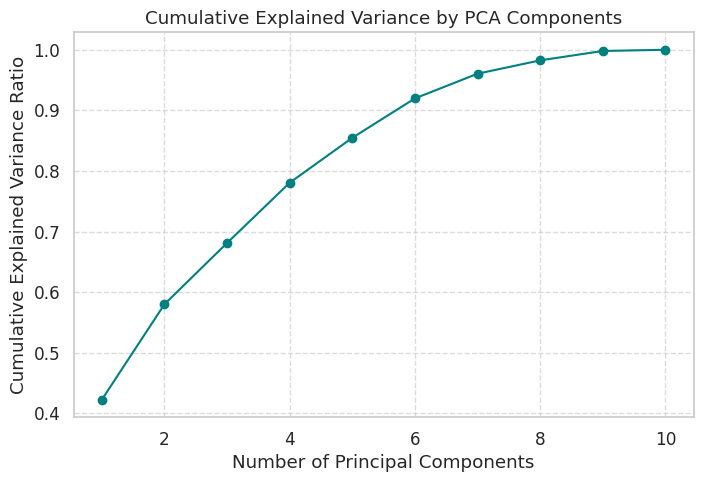


 Linear combinations for each principal component:


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
fLength,0.4083,-0.2257,0.0005,-0.0253,0.1195,0.0150,0.4375,0.7532,0.0905,0.0180
fWidth,0.3951,-0.2453,0.1527,-0.0946,0.0579,0.1689,0.4953,-0.5395,-0.4279,-0.0118
fSize,0.4489,0.0933,0.0706,-0.0575,0.0159,0.0276,0.0011,-0.3216,0.8157,0.1076
fConc,-0.4416,-0.1884,-0.1289,0.1086,0.1807,0.1043,0.3307,-0.0719,0.1487,0.7489
fConc1,-0.4292,-0.1960,-0.1392,0.1163,0.2056,0.1158,0.3891,-0.1052,0.3152,-0.6535
fAsym,-0.1447,0.4869,0.3773,-0.2139,-0.0227,0.7218,0.1136,0.1393,0.0070,-0.0001
fM3Long,0.0052,0.5996,0.0583,-0.0535,0.5987,-0.4599,0.2338,-0.0357,-0.0911,0.0027
fM3Trans,0.0124,-0.0315,0.6029,0.7947,0.0081,-0.0568,-0.0143,0.0173,0.0092,-0.0000
fAlpha,-0.0972,-0.4567,0.4699,-0.3863,0.5258,-0.0030,-0.3650,0.0266,0.0394,-0.0058
fDist,0.2567,0.0125,-0.4535,0.3639,0.5213,0.4587,-0.3186,-0.0164,-0.1089,-0.0053


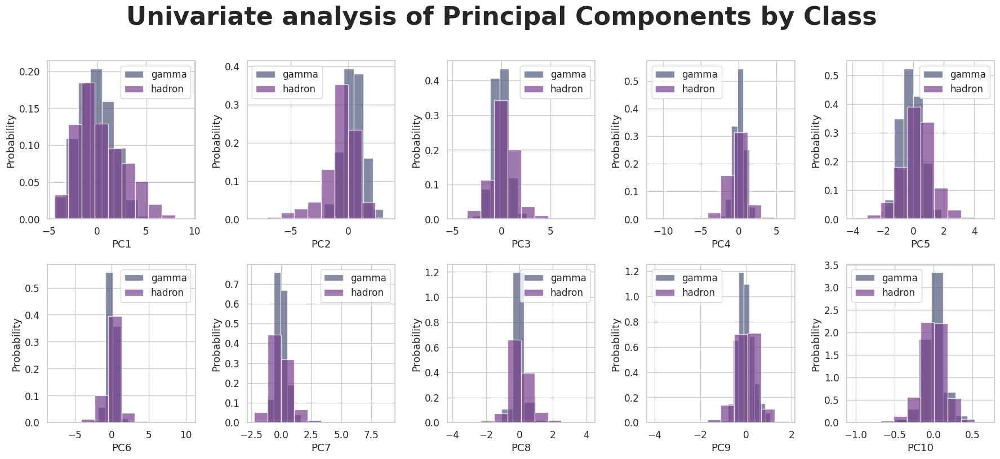

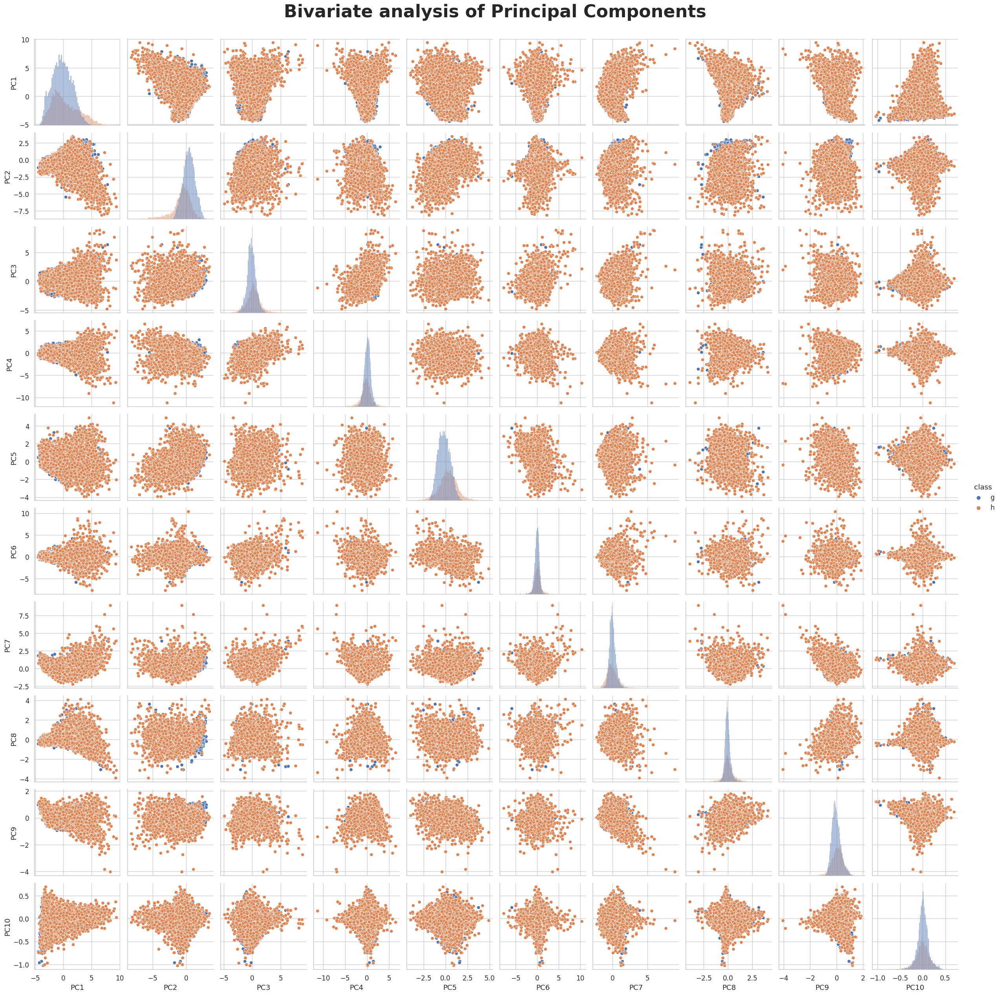

In [13]:
# PCA - Principal Component Analysis
# PCA reduces high-dimensional data into a smaller set of uncorrelated components that capture the maximum variance in the dataset.
# It helps to simplify, visualize, and identify dominant patterns while minimizing information loss.

# log_cols = ["fLength", "fWidth", "fAlpha"]
# X_df = df[columns[:-1]].copy()

# # Safe log transform: log(1 + x) handles zeros gracefully
# X_df[log_cols] = np.log1p(X_df[log_cols])

# # (Optional) if you prefer strict natural log, use:
# # eps = 1e-9
# # X_df[log_cols] = np.log(X_df[log_cols] + eps)

# # Keep X as an ndarray if you rely on it elsewhere
# X = X_df.values

X = df[columns[:-1]].values
y = df[columns[-1]].values

# Standardize data before PCA
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply PCA
n_components = 10
pca = PCA(n_components)
X_pca = pca.fit_transform(X_scaled)

# Explained variance ratio
explained_var = pca.explained_variance_ratio_
cum_var = np.cumsum(explained_var)

print('Explained variance by component:', explained_var)
print('Cumulative variance:', cum_var)
print('\n')

plt.figure(figsize=(8,5))
plt.plot(range(1, n_components+1), cum_var, marker='o', color='teal')
plt.title("Cumulative Explained Variance by PCA Components")
plt.xlabel("Number of Principal Components")
plt.ylabel("Cumulative Explained Variance Ratio")
plt.grid(True, linestyle="--", alpha=0.7)
plt.savefig("./EDA/magic_pca_.png")
plt.show()

# Get component loadings
loadings = pd.DataFrame(
    pca.components_.T,
    columns=[f"PC{i+1}" for i in range(pca.n_components_)],
    index=columns[:-1]
)
print("\n Linear combinations for each principal component:")
display(loadings.round(4))

pca_cols = [f"PC{i+1}" for i in range(n_components)]
pca_df = pd.DataFrame(X_pca[:, :n_components], columns=pca_cols)
pca_df["class"] = y

# --- Univariate histograms per PC (gamma vs hadron) ---
# n_components = min(10, X.shape[1])  # keep this consistent with PCA

# Choose a fixed number of columns and compute rows accordingly
cols = 5                                  # e.g., 5 plots per row
rows = math.ceil(n_components / cols)

fig, axes = plt.subplots(rows, cols, figsize=(18, 8))
axes = np.ravel(axes)  # robust flatten even if rows*cols == 1

for i, pc in enumerate(pca_cols):
    ax = axes[i]
    ax.hist(pca_df[pca_df["class"] == 'g'][pc], color="#52597D",
            label="gamma", alpha=0.7, density=True)
    ax.hist(pca_df[pca_df["class"] == 'h'][pc], color="#77418D",
            label="hadron", alpha=0.7, density=True)
    ax.set_xlabel(pc)
    ax.set_ylabel("Probability")
    ax.legend()
    
# Hide any leftover empty axes
for j in range(len(pca_cols), len(axes)):
    axes[j].axis("off")

plt.suptitle("Univariate analysis of Principal Components by Class",
             fontsize=32, weight="bold", y=1.02)
plt.tight_layout()
plt.savefig("./EDA/magic_pca_univariate_histograms.png", dpi=300)
plt.show()

# --- Bivariate histograms per PC (gamma vs hadron) ---

sns.pairplot(pca_df, hue="class", diag_kind="hist")
             
plt.suptitle("Bivariate analysis of Principal Components", fontsize=32, weight="bold", y=1.02)
plt.savefig("./EDA/magic_pca_pairplot_components.png", dpi=300)
plt.show()




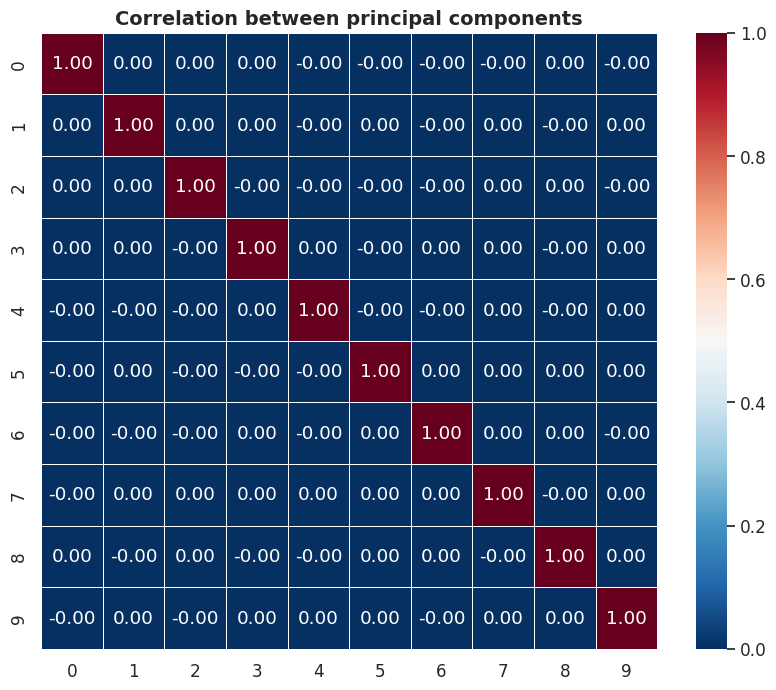

In [14]:
# Pearson correlation between features
# cm = X_pca.corr() # To avoid class labels; ‘kendall’, ‘spearman’
cm = np.corrcoef(X_pca, rowvar=False)  # correlations across columns (components)

plt.figure(figsize=(10,8))
sns.heatmap(cm, cmap='RdBu_r', annot=True, fmt=".2f",  # <-- format annotations to 2 decimals
            cbar=True, square=True, linewidths=0.5)
# sns.heatmap(cm, cmap='RdBu_r', annot=True)
plt.title("Correlation between principal components", fontsize=14, weight='bold')
plt.savefig("./EDA/magic_correlation_pcs_.png")
plt.show()



## Step 1 — Modeling Setup (Low-FPR Focus)

This step builds and compares several classifiers for **gamma vs. hadron** separation, optimized for **low false-positive rate (FPR)** performance.

**Models used:** Decision Tree, Random Forest, RBF-SVM, Gradient Boosting (GBDT), MLP, and XGBoost.  
Each model is tuned with **5-fold Stratified CV**, using **partial AUC (pAUC@≤0.10)** as the selection metric.

**Evaluation metrics:**
- **TPR at target FPRs:** 0.01, 0.02, 0.05, 0.10, 0.20  
- **pAUC** and **Full AUC** on test set  
- **Confusion matrix** (labels `'h'` and `'g'`) and **ROC curves**  
- **Overlay ROC** for all models

**Preprocessing variants tested:**
1. **Baseline:** all features → `StandardScaler`
<!-- 2. **Log-transform:** `log1p` on `fLength`, `fWidth`, `fAlpha` → `StandardScaler` -->
2. **PCA (95% variance):** retain PCs explaining ≥95% variance
<!-- 4. **Log + PCA:** combine steps 2 and 3   -->
3. **PCs + fAlpha:** add `fAlpha` (top MI feature) to PCs from step 2 

**Goal:** Find the preprocessing + model combination that yields **highest TPR** while keeping **FPR very low**.

---

### Class Labels & ROC Interpretation

- **'g' = 1 (signal, positive)**  **'h' = 0 (background, negative)**
- “Accepting background as signal” corresponds to the **false positive rate (FPR)** on the ROC curve:

  $$
  \text{FPR} = P(\hat{y}=1 \mid y=0)
  $$

- Compare classifiers at ROC points where the background acceptance is restricted:

  $$
  \text{FPR} \le \{0.01,\,0.02,\,0.05,\,0.10,\,0.20\}
  $$

*Tip:* If labels aren’t 0/1, map **signal → 1**, **background → 0**,  
or set `pos_label='g'` when computing the ROC.
